# <p align="center"><span style="color: blue;"><strong><u>Binary Classification with a Bank Churn Dataset</u></strong></span></p>

 # <span style="color: blue;"><strong><u>About Author</u></strong></span></p>
**Author: Muhammad kashif**\
**Project: Binary Classification with a Bank Churn Dataset**
# <span style="color: blue;"><strong><u>Contact Info</u></strong></span></p>
**Click on link below to contact/follow/correct me:**

<p align="center">
  <a href="https://github.com/MUHAMMADKASHIF3322">
    <img src="https://img.shields.io/badge/GitHub-000000?style=for-the-badge&logo=github&logoColor=white" alt="GitHub">
  </a>
  <a href="https://www.kaggle.com/muhammadkashif3322">
    <img src="https://img.shields.io/badge/Kaggle-20BEFF?style=for-the-badge&logo=kaggle&logoColor=white" alt="Kaggle">
  </a>
  <a href="www.linkedin.com/in/muhammad-kashif-900b06338">
    <img src="https://img.shields.io/badge/LinkedIn-0077B5?style=for-the-badge&logo=linkedin&logoColor=white" alt="LinkedIn">
  </a>
  <a href="mailto:alikashif3322@gmail.com">
    <img src="https://img.shields.io/badge/Email-D14836?style=for-the-badge&logo=gmail&logoColor=white" alt="Email">
  </a>
</p>


**AIM and Objective:** 
- We will classify that which customers who will stay in our bank or leave our bank with the help of Machine learning, Deep Learning(Neural Networks) 
- Firstly I undergoes Exploratory Data Analysis( For Taking Insights about each column)
- Then Train the Model using Deep Neural Network to predict whether a customer churn in the bank or not


**Dataset Description:**\
`Customer ID`: A special number for each customer

`Surname`: The customer's last name

`Credit Score`: A number showing how good the customer is with money

`Geography`: The country where the customer lives

`Gender`: Whether the customer is a man or a woman

`Age`: How old the customer is

`Tenure`: How many years the customer has been with the bank

`Balance`: How much money the customer has in their account

`NumOfProducts`: How many bank things the customer uses, like savings or credit cards

`HasCrCard`: If the customer has a credit card or not

`IsActiveMember`: If the customer is actively using the bank services

`EstimatedSalary`: An estimate of how much the customer earns

`Exited`: If the customer has left the bank (this is what we want to find out)

**Python Version Used: 3.11.11**

 # <span style="color:red;"><strong><u>Import Libararies </u></strong></span></p>


In [76]:
# Import Libararies
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 
import plotly.express as px
# Import Standaradscalar, MinMaxScaler, LabelEncoder
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
#import iterative imputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
# Import train test split
from sklearn.model_selection import train_test_split
# for Mchine learning
#For Regression
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor,GradientBoostingRegressor
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBRegressor
from sklearn.naive_bayes import GaussianNB
#For classification
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
# import pipeline
from sklearn.pipeline import Pipeline
# import cross validation score
from sklearn.model_selection import cross_val_score
# import Metrics
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
# Import Deep Learning Libararies
import tensorflow as tf 
from tensorflow import keras
from tensorflow.keras import layers
# import Earlystopping
from tensorflow.keras.callbacks import EarlyStopping
# Remove Warnings
import warnings
warnings.filterwarnings("ignore")


 # <span style="color:red;"><strong><u>Load the Training, Testing and Submission Data </u></strong></span></p>


In [77]:
# load the train data
train_df = pd.read_csv("train.csv")

# load the test data
test_df = pd.read_csv("test.csv")

# load the sample submission data
submission = pd.read_csv("sample_submission.csv")

In [78]:
# check the first 5 rows of the train data
train_df.head()


,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,0,15674932,Okwudilichukwu,668,France,Male,33.0,3,0.00,2,1.0,0.0,181449.97,0
1,1,15749177,Okwudiliolisa,627,France,Male,33.0,1,0.00,2,1.0,1.0,49503.50,0
2,2,15694510,Hsueh,678,France,Male,40.0,10,0.00,2,1.0,0.0,184866.69,0
3,3,15741417,Kao,581,France,Male,34.0,2,148882.54,1,1.0,1.0,84560.88,0
4,4,15766172,Chiemenam,716,Spain,Male,33.0,5,0.00,2,1.0,1.0,15068.83,0


In [79]:
# check the first 5 rows of the test data
test_df.head()

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,165034,15773898,Lucchese,586,France,Female,23.0,2,0.00,2,0.0,1.0,160976.75
1,165035,15782418,Nott,683,France,Female,46.0,2,0.00,1,1.0,0.0,72549.27
2,165036,15807120,K?,656,France,Female,34.0,7,0.00,2,1.0,0.0,138882.09
3,165037,15808905,O'Donnell,681,France,Male,36.0,8,0.00,1,1.0,0.0,113931.57
4,165038,15607314,Higgins,752,Germany,Male,38.0,10,121263.62,1,1.0,0.0,139431.00


In [80]:
# check the first 5 rows of the sample submission data
submission.head()

,id,Exited
0,165034,0.5
1,165035,0.5
2,165036,0.5
3,165037,0.5
4,165038,0.5



 # <span style="color:red;"><strong><u>Basic info of traning dataset</u></strong></span></p>


In [81]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165034 entries, 0 to 165033
Data columns (total 14 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id               165034 non-null  int64  
 1   CustomerId       165034 non-null  int64  
 2   Surname          165034 non-null  object 
 3   CreditScore      165034 non-null  int64  
 4   Geography        165034 non-null  object 
 5   Gender           165034 non-null  object 
 6   Age              165034 non-null  float64
 7   Tenure           165034 non-null  int64  
 8   Balance          165034 non-null  float64
 9   NumOfProducts    165034 non-null  int64  
 10  HasCrCard        165034 non-null  float64
 11  IsActiveMember   165034 non-null  float64
 12  EstimatedSalary  165034 non-null  float64
 13  Exited           165034 non-null  int64  
dtypes: float64(5), int64(6), object(3)
memory usage: 17.6+ MB


In [82]:
train_df.dtypes

id                   int64
CustomerId           int64
Surname             object
CreditScore          int64
Geography           object
Gender              object
Age                float64
Tenure               int64
Balance            float64
NumOfProducts        int64
HasCrCard          float64
IsActiveMember     float64
EstimatedSalary    float64
Exited               int64
dtype: object


 # <span style="color:red;"><strong><u> Summary statistics  </u></strong></span></p>


In [83]:
train_df.describe()

,id,CustomerId,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
count,165034.0000,1.650340e+05,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000
mean,82516.5000,1.569201e+07,656.454373,38.125888,5.020353,55478.086689,1.554455,0.753954,0.497770,112574.822734,0.211599
std,47641.3565,7.139782e+04,80.103340,8.867205,2.806159,62817.663278,0.547154,0.430707,0.499997,50292.865585,0.408443
min,0.0000,1.556570e+07,350.000000,18.000000,0.000000,0.000000,1.000000,0.000000,0.000000,11.580000,0.000000
25%,41258.2500,1.563314e+07,597.000000,32.000000,3.000000,0.000000,1.000000,1.000000,0.000000,74637.570000,0.000000
50%,82516.5000,1.569017e+07,659.000000,37.000000,5.000000,0.000000,2.000000,1.000000,0.000000,117948.000000,0.000000
75%,123774.7500,1.575682e+07,710.000000,42.000000,7.000000,119939.517500,2.000000,1.000000,1.000000,155152.467500,0.000000
max,165033.0000,1.581569e+07,850.000000,92.000000,10.000000,250898.090000,4.000000,1.000000,1.000000,199992.480000,1.000000


In [84]:
# Display  maximum row and column
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [85]:
# check the shape of the train data
print('The train data has {} rows and {} columns'.format(train_df.shape[0], train_df.shape[1]))

The train data has 165034 rows and 14 columns


obseveration: 
> - The train dataset  consists of 165034 row and 14 columns
> - in it 6 columns are of int datatype such as id ,CustomerId, CreditScore, Tenure, NumOfProducts, Exited.
>-  in it 5 column are of float dtype such as Age, Balance, HasCrCard, IsActiveMember, EstimatedSalary.
>- in it 3 columns are of object datatype such as Surname, Geography, Gender


 # <span style="color:red;"><strong><u>Exploratory Data Analysis </u></strong></span></p>



In [86]:
train_df.columns

Index(['id', 'CustomerId', 'Surname', 'CreditScore', 'Geography', 'Gender',
       'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Exited'],
      dtype='object')



 
 ## <span style="color:red;"><strong><u>let check the Missing values </u></strong></span></p>


In [87]:
# let's check the missing values of the train data
train_df.isnull().sum()

id                 0
CustomerId         0
Surname            0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

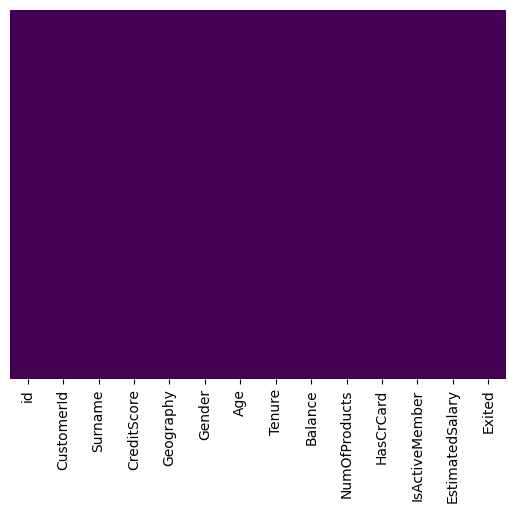

In [88]:
# let's check the missing values  by ploting
sns.heatmap(train_df.isnull(), yticklabels=False, cbar=False, cmap='viridis')
plt.show()

observation: 
>- There is no Missing value present in train data  


 ## <span style="color:red;"><strong><u>Check the duplicate value </u></strong></span></p>


In [89]:
# check the duplicate values of the train data
train_df.duplicated().sum()

np.int64(0)

In [90]:
train_df.duplicated().any()

np.False_

observation:  
>- There are no duplicate value present in train dataset 

 
 ## <span style="color:red;"><strong><u>let's explore Each columns of training data </u></strong></span></p>
## <span style="color:red;"><strong><u>let's explore the id columns</u></strong></span></p>


In [91]:
print(' The maximum value of train data in id column is',train_df['id'].max())
print(' The minimum value of train data in id column is',train_df['id'].min())


 The maximum value of train data in id column is 165033
 The minimum value of train data in id column is 0


observation: 
>- The maximum value of train data is 165033
>- The minimum value of taine data is 0


  ## <span style="color:red;"><strong><u> Lets explore the CustomerId column </u></strong></span></p>


In [92]:
train_df['CustomerId'].describe()


count    1.650340e+05
mean     1.569201e+07
std      7.139782e+04
min      1.556570e+07
25%      1.563314e+07
50%      1.569017e+07
75%      1.575682e+07
max      1.581569e+07
Name: CustomerId, dtype: float64

In [93]:
# print the mean, median and mode of the customer id in train data
# print the mean of customer id
print('The mean of train data in customer id is',train_df['CustomerId'].mean())
# print the median of customer id
print('The median of train data in customer id is',train_df['CustomerId'].median())
# print the mode of customer id
print('The mode of train data in column id is',train_df['CustomerId'].mode())

The mean of train data in customer id is 15692005.019026382
The median of train data in customer id is 15690169.0
The mode of train data in column id is 0    15682355
Name: CustomerId, dtype: int64


In [94]:
train_df.groupby('Gender')["CustomerId"].describe()


,count,mean,std,min,25%,50%,75%,max
Gender,,,,,,,,
Female,71884.0,1.569216e+07,71258.047192,15565701.0,15633612.0,15690647.0,15756668.5,15815690.0
Male,93150.0,1.569188e+07,71505.634060,15565701.0,15632850.0,15689955.0,15756850.0,15815690.0


In [95]:
fig= px.histogram(train_df['CustomerId'],color=train_df['Gender'])
fig.show()

observation: 
>- The mode of CustomerId column: 15682355
>- The Mean of CustomerId column: 15692005.019026382
>- The Median of CustomerId column is: 15690169.0
>- The Maximum Customer id of Male in df_train is 15815690.0
>- The Maximum Customer id of Femmale in df_train is 15815690.0
>- The Minimum Customer id of Male in df_train is 15565701.0
>- The Minimum Customer id of Female in df_train is 15565701.0


 ## <span style="color:red;"><strong><u>let's explore the surname columns </u></strong></span></p>


In [96]:
# Display all unique surnames
unique_surnames = train_df['Surname'].unique()
print('The unique values of Surname column is:',unique_surnames)
print('The Total unique values of Surname column is:', train_df['Surname'].nunique())

The unique values of Surname column is: ['Okwudilichukwu' 'Okwudiliolisa' 'Hsueh' ... 'Aliyev' 'McMinn' 'Elkins']
The Total unique values of Surname column is: 2797


In [97]:
data=train_df.groupby('Gender')['Surname'].describe()
data

,count,unique,top,freq
Gender,,,,
Female,71884,2474,Hsia,1029
Male,93150,2556,Hsia,1427


In [98]:
fig = px.bar(data, x=data.index, y='count')
fig.show()

Observations:
>- The Total unique values of Surname column is: 2797.
>- The Top Surname based on Gender is Hsia.
>- The count of Surname column based on the Gender(Male) is 93.15k.
>- The count of Surname column based on the Gender(Female) is 71.884k.


 ## <span style="color:red;"><strong><u>Lets explore the CreditScore column  </u></strong></span></p>


In [99]:
train_df['CreditScore'].describe()

count    165034.000000
mean        656.454373
std          80.103340
min         350.000000
25%         597.000000
50%         659.000000
75%         710.000000
max         850.000000
Name: CreditScore, dtype: float64

In [100]:
data1=train_df.groupby('Gender')['CreditScore'].describe()
data1

,count,mean,std,min,25%,50%,75%,max
Gender,,,,,,,,
Female,71884.0,656.243726,80.502500,350.0,597.0,659.0,710.0,850.0
Male,93150.0,656.616930,79.793996,350.0,598.0,660.0,710.0,850.0


In [101]:
fig = px.histogram(train_df['CreditScore'], color=train_df['Gender'])
fig.show()

Observations:
>- The Maximum Creditscore based on Gender (Male and Female) is 850-851.
>- The Minimum Creditscore based on Gender (Male and Female) is 350-351.
>- The Creditscore count of Female is 71884.0.
>- The Creditscore count of Male is 93150.0


  ## <span style="color:red;"><strong><u>Let's explore the Geography column  </u></strong></span></p>


In [102]:
train_df['Geography'].value_counts()


Geography
France     94215
Spain      36213
Germany    34606
Name: count, dtype: int64

In [103]:
# Group the train_df by 'Geography' and calculate the sum of the columns
sum_df = train_df.groupby('Geography').sum().reset_index()

# Create a choropleth map using Plotly Express
fig = px.choropleth(sum_df, locations='Geography', locationmode='country names',
                    color='CreditScore', hover_name='Geography',
                    title='Sum of CreditScore by Geography')

# Display the map
fig.show()

Observations:
>- The valuecounts of France is 94215
>- The valuecounts of Spain is 36213
>- The valuecounts of Germany is 34606
>- The Creditscore of the people of France is 61.81075M
>- The Creditscore of the people of Spain is 23.79316M
>- The Creditscore of the people of Germany is 22.73338M


 ## <span style="color:red;"><strong><u> let's explore the sex column </u></strong></span></p>


In [104]:
train_df['Gender'].value_counts()

Gender
Male      93150
Female    71884
Name: count, dtype: int64

<Axes: xlabel='Gender', ylabel='Count'>

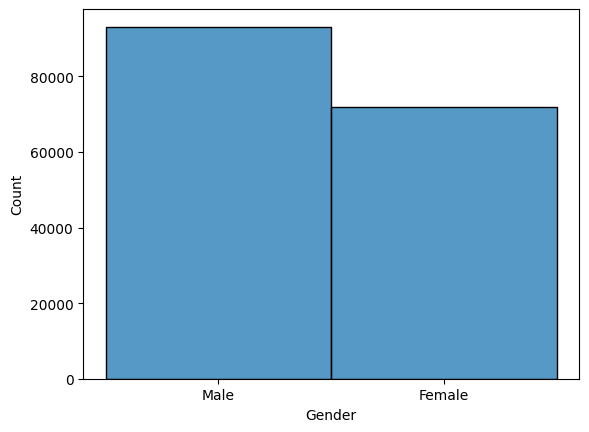

In [105]:
sns.histplot(train_df['Gender'])

In [106]:
# Calculate the percentage of male and female by first calculating the male and female count
male_count=93150
Female_count=71884
total_count=male_count-Female_count
# Calculate the percentage of male and Female
percentage_male = (male_count / total_count) * 100
percentage_Female = (Female_count / total_count) * 100
# Display the Male and Female percentages present in the Dataset
print(f"The percentage of male is: {percentage_male:.2f}%")
print(f"The percentage of Female is: {percentage_Female:.2f}%")
# Calculate the Difference 
Difference_percentage=(male_count-Female_count)/(Female_count)*100
# Print the Difference in percentage of Male and Female
print(f"percentage_male is {Difference_percentage: .2f}% more than female_percentage")

The percentage of male is: 438.02%
The percentage of Female is: 338.02%
percentage_male is  29.58% more than female_percentage


Observations:
>- The Male in df_train is 93150
>- The Female in df_train is 71884
>- The percentage of male is: 438.02%
>- The percentage of Female is: 338.02%
>- percentage_male is 29.58% more than female_percentage


 ## <span style="color:red;"><strong><u>Let's Explore the Age column</u></strong></span></p>


In [107]:
#   Display thestatistics of Age column
train_df['Age'].describe()

count    165034.000000
mean         38.125888
std           8.867205
min          18.000000
25%          32.000000
50%          37.000000
75%          42.000000
max          92.000000
Name: Age, dtype: float64

In [108]:
# Display Statistics of Age column based on sex
train_df.groupby('Gender')['Age'].describe()

,count,mean,std,min,25%,50%,75%,max
Gender,,,,,,,,
Female,71884.0,38.763207,9.124936,18.0,33.0,38.0,44.0,92.0
Male,93150.0,37.634068,8.631011,18.0,32.0,37.0,41.0,92.0


In [109]:
fig=px.histogram(train_df['Age'], color=train_df['Gender'])
fig.show()

# <span style="color:red;"><strong><u>Feature Engineering </u></strong></span></p>
 ## <span style="color:red;"><strong><u>Create the binned_Age column </u></strong></span></p>


In [110]:
bins=[18, 40, 60, 75, 90]
labels=['Adult', 'Middle_aged', 'older', 'oldest']
train_df['binned_Age']=pd.cut(train_df['Age'], bins=bins, labels=labels)
train_df.head()

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,binned_Age
0,0,15674932,Okwudilichukwu,668,France,Male,33.0,3,0.00,2,1.0,0.0,181449.97,0,Adult
1,1,15749177,Okwudiliolisa,627,France,Male,33.0,1,0.00,2,1.0,1.0,49503.50,0,Adult
2,2,15694510,Hsueh,678,France,Male,40.0,10,0.00,2,1.0,0.0,184866.69,0,Adult
3,3,15741417,Kao,581,France,Male,34.0,2,148882.54,1,1.0,1.0,84560.88,0,Adult
4,4,15766172,Chiemenam,716,Spain,Male,33.0,5,0.00,2,1.0,1.0,15068.83,0,Adult


In [111]:
# Lets check the binned_Age percentage of missing values
print('The binned_Age column percentage is:',train_df['binned_Age'].isnull().sum()/len(train_df)*100)

The binned_Age column percentage is: 0.0781657113079729


In [112]:
# Lets impute the missing values of binned_Age
train_df['binned_Age'].fillna(train_df['binned_Age'].mode()[0], inplace=True)


In [113]:
 # check the missing value 
train_df.isnull().sum()

id                 0
CustomerId         0
Surname            0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
binned_Age         0
dtype: int64

Observations:
>- The Minimum Age of people in df_train is 18.000000
>- The Maximum Age of people in df_train is 92.000000
>- The count of Female is 71884.0
>-The count of Male is 93150.0
>-After taking Insights of Age column then I created the bins of age column
>- Then I imputed the Missing Values present in the binned_Age column using mode as the percentage of missing values in binned_Age column is 0.07%


## <span style="color:red;"><strong><u> Let's Explore the Tenure column </u></strong></span></p>



In [114]:
# Sumary statistics of Tenure column
train_df['Tenure'].describe()

count    165034.000000
mean          5.020353
std           2.806159
min           0.000000
25%           3.000000
50%           5.000000
75%           7.000000
max          10.000000
Name: Tenure, dtype: float64

In [115]:
# Lets check the Tenure based on sex of df_train data
train_df.groupby('Gender')['Tenure'].describe()

,count,mean,std,min,25%,50%,75%,max
Gender,,,,,,,,
Female,71884.0,4.992349,2.811852,0.0,3.0,5.0,7.0,10.0
Male,93150.0,5.041965,2.801581,0.0,3.0,5.0,7.0,10.0


In [116]:
fig=px.histogram(train_df['Tenure'], color=train_df['Gender'])
fig.show()


Observations:
>- The Female count of df_train is 71884.0
>- The Male count of df_train is 93150.0
>- The Maximum Tenure of Male and Female is 10 Year


## <span style="color:red;"><strong><u>Lets Explore the Balance column</u></strong></span></p>


In [117]:
# Summary Statistics of Gender column
train_df['Balance'].describe()

count    165034.000000
mean      55478.086689
std       62817.663278
min           0.000000
25%           0.000000
50%           0.000000
75%      119939.517500
max      250898.090000
Name: Balance, dtype: float64

In [118]:
# Lets check the Balance base on Gender
fig=px.histogram(train_df['Age'], color=train_df['Gender'])
fig.show()

Observations:
>- The Maximum Balance of people in df_train is 250898.090000
>- The Mean Balance of people in df_train is 55478.086689

 
## <span style="color:red;"><strong><u>lets Explore the NumOfProducts column</u></strong></span></p>


In [119]:
train_df['NumOfProducts'].describe()

count    165034.000000
mean          1.554455
std           0.547154
min           1.000000
25%           1.000000
50%           2.000000
75%           2.000000
max           4.000000
Name: NumOfProducts, dtype: float64

In [120]:
# Lets plot the Histogram of NumOfProducts
fig=px.histogram(train_df, x='Geography', color='NumOfProducts')
fig.show()

Observations:
>- The Maximum NoOfProducts in df_train is 4.000000
>- The Minimum NoOfProducts in df_train is 1.000000


 ## <span style="color:red;"><strong><u>Lets Explore the HasCrCard column </u></strong></span></p>

`HasCrCard column` usually contains two values:

- "1" to indicate that the customer has a credit card
- "0" to indicate that the customer does not have a credit car

In [121]:
train_df['HasCrCard'].value_counts()

HasCrCard
1.0    124428
0.0     40606
Name: count, dtype: int64

In [122]:
fig=px.histogram(train_df['HasCrCard'], color=train_df['Geography'])
fig.show()

Observations:
>- In df_train 124428 people have HasCrCard
>- 40606 people donot have HasCrCard
>- 8659 people in Germany donot have HasCrCard in according to df_train
>- 9323 people in spain donot have HasCrCard in according to df_train
>- 22.624k people in France donot have HasCrCard in according to df_train
>- 25.947k people in Germany have HasCrCard in according to df_train
>- 26.89k people in span have HasCrCard in according to df_train
>- 71.59k people in span have France in according to df_train


 ## <span style="color:red;"><strong><u>Let's Explore the IsActiveMember column </u></strong></span></p>

The `IsActiveMember` column usually contains two values:

- "1" to indicate that the customer is an active member .
- "0" to indicate that the customer is not an active member.

In [123]:
# Lets Explore the IsActiveMember column
train_df['IsActiveMember'].value_counts()

IsActiveMember
0.0    82885
1.0    82149
Name: count, dtype: int64

In [124]:
fig=px.histogram(train_df['IsActiveMember'], color=train_df['Geography'])
fig.show()

Observations:
>- 82885 people donot IsActiveMember
>- 82149 people are IsActiveMember
>- 16.002k people are IsActiveMember in Germany
>- 18.52k people are IsActiveMember in Span
>- 47.626 people are IsActiveMember in France
>- 18.604k people donot IsActiveMember in Germany
>- 17.693k people donot IsActiveMember in Span
>- 46.588k people donot IsActiveMember in France

 
 ## <span style="color:red;"><strong><u>Let's Explore the EstimatedSalary Column </u></strong></span></p>


In [125]:
train_df['EstimatedSalary'].describe()

count    165034.000000
mean     112574.822734
std       50292.865585
min          11.580000
25%       74637.570000
50%      117948.000000
75%      155152.467500
max      199992.480000
Name: EstimatedSalary, dtype: float64

In [126]:
# Lets calculate the Estimatedsalary based on Gender
train_df.groupby('Gender')['EstimatedSalary'].describe()

,count,mean,std,min,25%,50%,75%,max
Gender,,,,,,,,
Female,71884.0,113020.123777,50552.841179,11.58,74800.99,118974.85,156439.560,199992.48
Male,93150.0,112231.183226,50088.885067,11.58,74588.41,117122.50,153829.455,199992.48


In [127]:
fig=px.histogram(train_df['EstimatedSalary'], color=train_df['Gender'])
fig.show()

Observation:
>- The Maximum Estimated salary of Male and Female is 199992.48k
>- The Minimum Estimatedsalary of Male and Female is 11.58k


 ## <span style="color:red;"><strong><u>Let's Explore the Exited Column  </u></strong></span></p>

The `Exited` column consists of Two values .It is Binary Variable

It represents whether customer has exited or is still an active customer.
"0" represents the customer has exited
"1" represents the customer has not exited or is still an active customer

In [128]:
train_df['Exited'].value_counts()

Exited
0    130113
1     34921
Name: count, dtype: int64

In [129]:
train_df.groupby('Gender')['Exited'].value_counts()

Gender  Exited
Female  0         51779
        1         20105
Male    0         78334
        1         14816
Name: count, dtype: int64

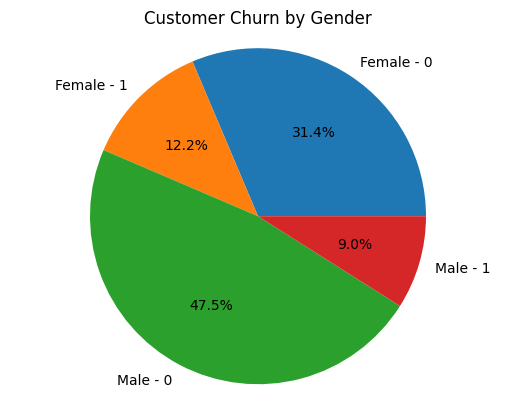

In [130]:
grouped_data = train_df.groupby('Gender')['Exited'].value_counts()

# Prepare labels and values for pie chart
labels = []
values = []

for key, value in grouped_data.items():
    gender, exited = key
    labels.append(f"{gender} - {exited}")
    values.append(value)

# Plotting the pie chart
plt.pie(values, labels=labels, autopct='%1.1f%%')
plt.axis('equal')  # Equal aspect ratio ensures pie is circular.
plt.title("Customer Churn by Gender")
plt.show()


In [131]:
fig=px.histogram(train_df['Exited'], color=train_df['Gender'])
fig.show()

Observations:
>- 51779 Female donot Exited or is still active member
>- 20105 Female have been Exited
>- 78334 Male donot Exited or is still active member
>- 14816 Male have been Exited

In [132]:
# Copy df_train to df
df=train_df.copy()
df.head()

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,binned_Age
0,0,15674932,Okwudilichukwu,668,France,Male,33.0,3,0.00,2,1.0,0.0,181449.97,0,Adult
1,1,15749177,Okwudiliolisa,627,France,Male,33.0,1,0.00,2,1.0,1.0,49503.50,0,Adult
2,2,15694510,Hsueh,678,France,Male,40.0,10,0.00,2,1.0,0.0,184866.69,0,Adult
3,3,15741417,Kao,581,France,Male,34.0,2,148882.54,1,1.0,1.0,84560.88,0,Adult
4,4,15766172,Chiemenam,716,Spain,Male,33.0,5,0.00,2,1.0,1.0,15068.83,0,Adult


In [133]:
df.columns

Index(['id', 'CustomerId', 'Surname', 'CreditScore', 'Geography', 'Gender',
       'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Exited', 'binned_Age'],
      dtype='object')

In [134]:
cat_cols=['Surname', 'Geography', 'Gender', 'Tenure', 'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'Exited', 'binned_Age']
num_cols=['CreditScore', 'Age', 'Balance', 'EstimatedSalary']

Observations:
>-  'Tenure', 'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'Exited' are also considered as the Categorical columns based on the order and the factor.
>- 'Tenure' are considered as the Categorical columns based on the factor as it has the values ranges from 0-10
>- 'NumOfProducts' are considered as the Categorical columns based on the order as it has the values ranges from 0-4
>- 'IsActiveMember', 'Exited' are considered as the Categorical columns as these belongs to binary class


 ## <span style="color:red;"><strong><u>let's plot the distribution of numerical columns using the sns and kde=true </u></strong></span></p>


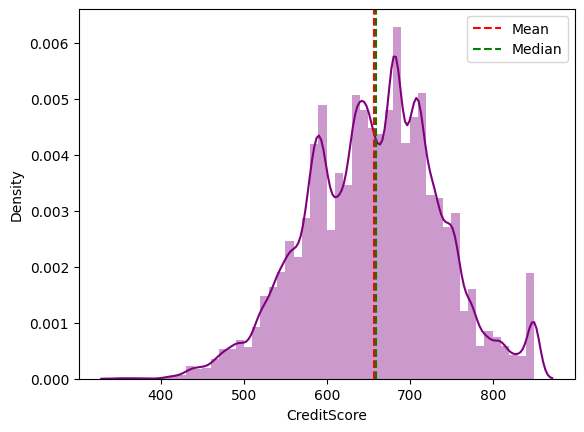

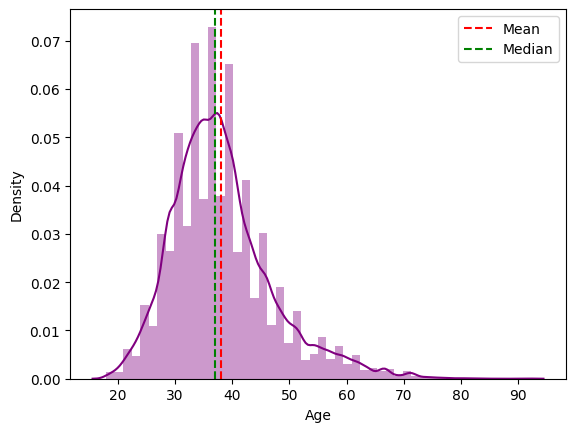

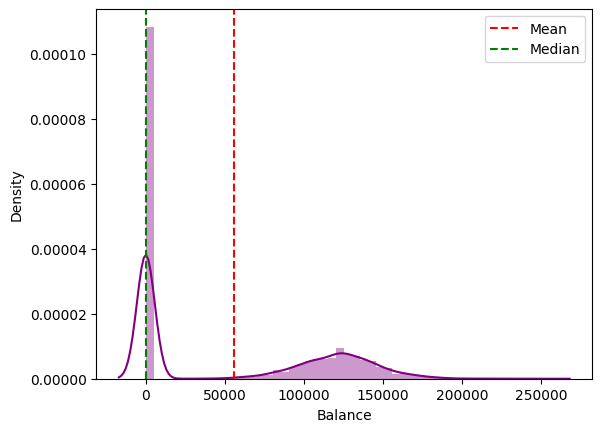

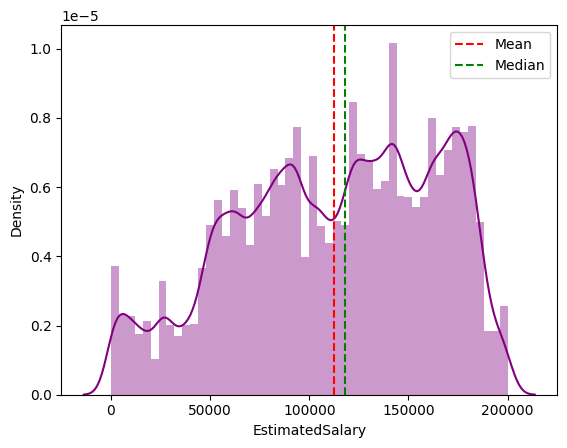

In [135]:
# Plot of Numeric columns
for col in num_cols:
    sns.distplot(df[col], kde=True, color='purple')
    # lets add the Mean and Median line in each plot
    plt.axvline(df[col].mean(), color='r', linestyle='--', label='Mean')
    plt.axvline(df[col].median(), color='g', linestyle='--', label='Median')
    plt.legend()
    plt.show()


 # <span style="color:red;"><strong><u> Scaling the numerical columns </u></strong></span></p>


In [136]:
scalar=StandardScaler()
df[num_cols]=scalar.fit_transform(df[num_cols])


# <span style="color:red;"><strong><u> Transformation </u></strong></span></p>

**why we use transformation ?**
>- Normalize the data to make it more Gaussian (bell-shaped)
>- Reduce skewness in numerical features
>- Improve model accuracy and training speed
>-  Make features more suitable for algorithms like linear regression, logistic regression, neural networks, etc.

In [137]:
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import PowerTransformer
pt_boxcox=PowerTransformer(standardize=True)
df[num_cols]=pt_boxcox.fit_transform(df[num_cols])
pt_yeojohnson=PowerTransformer(standardize=True)
df[num_cols]=pt_yeojohnson.fit_transform(df[num_cols])
qt_normal=QuantileTransformer(output_distribution='normal', random_state=42)
df[num_cols]=qt_normal.fit_transform(df[num_cols])


 # <span style="color:red;"><strong><u>Encoding the catagorical columns</u></strong></span></p>


In [138]:
le=LabelEncoder()
df['Gender']=le.fit_transform(df['Gender'])
df['Geography']=le.fit_transform(df['Geography'])
df['binned_Age']=le.fit_transform(df['binned_Age'])

In [139]:
df.head()

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,binned_Age
0,0,15674932,Okwudilichukwu,0.116941,0,1,-0.573115,3,-5.199338,2,1.0,0.0,1.553764,0,0
1,1,15749177,Okwudiliolisa,-0.384375,0,1,-0.573115,1,-5.199338,2,1.0,1.0,-1.187991,0,0
2,2,15694510,Hsueh,0.212353,0,1,0.393847,10,-5.199338,2,1.0,0.0,1.751424,0,0
3,3,15741417,Kao,-0.901416,0,1,-0.419741,2,1.573941,1,1.0,1.0,-0.504018,0,0
4,4,15766172,Chiemenam,0.798769,2,1,-0.573115,5,-5.199338,2,1.0,1.0,-1.738455,0,0



 # <span style="color:red;"><strong><u>Deep Learning (Neural Network)</u></strong></span></p>


In [140]:
# Select the Features and labels
x=df.drop(['Exited', 'id', 'CustomerId', 'Surname'], axis=1)
y=df['Exited']

In [141]:
x.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,binned_Age
0,0.116941,0,1,-0.573115,3,-5.199338,2,1.0,0.0,1.553764,0
1,-0.384375,0,1,-0.573115,1,-5.199338,2,1.0,1.0,-1.187991,0
2,0.212353,0,1,0.393847,10,-5.199338,2,1.0,0.0,1.751424,0
3,-0.901416,0,1,-0.419741,2,1.573941,1,1.0,1.0,-0.504018,0
4,0.798769,2,1,-0.573115,5,-5.199338,2,1.0,1.0,-1.738455,0


In [142]:
# split the data into train and test
x_train, x_test, y_train, y_test=train_test_split(x, y, test_size=0.2, random_state=42)

Epoch 1/100
4126/4126 ━━━━━━━━━━━━━━━━━━━━ 17s 3ms/step - accuracy: 0.8201 - loss: 0.4066 - val_accuracy: 0.8582 - val_loss: 0.3383
Epoch 2/100
4126/4126 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - accuracy: 0.8582 - loss: 0.3394 - val_accuracy: 0.8640 - val_loss: 0.3278
Epoch 3/100
4126/4126 ━━━━━━━━━━━━━━━━━━━━ 12s 3ms/step - accuracy: 0.8633 - loss: 0.3287 - val_accuracy: 0.8643 - val_loss: 0.3257
Epoch 4/100
4126/4126 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - accuracy: 0.8618 - loss: 0.3303 - val_accuracy: 0.8626 - val_loss: 0.3350
Epoch 5/100
4126/4126 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - accuracy: 0.8623 - loss: 0.3281 - val_accuracy: 0.8656 - val_loss: 0.3224
Epoch 6/100
4126/4126 ━━━━━━━━━━━━━━━━━━━━ 24s 3ms/step - accuracy: 0.8626 - loss: 0.3270 - val_accuracy: 0.8648 - val_loss: 0.3220
Epoch 7/100
4126/4126 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - accuracy: 0.8650 - loss: 0.3225 - val_accuracy: 0.8646 - val_loss: 0.3238
Epoch 8/100
4126/4126 ━━━━━━━━━━━━━━━━━━━━ 21s 4ms/step - accuracy: 0.8644 -

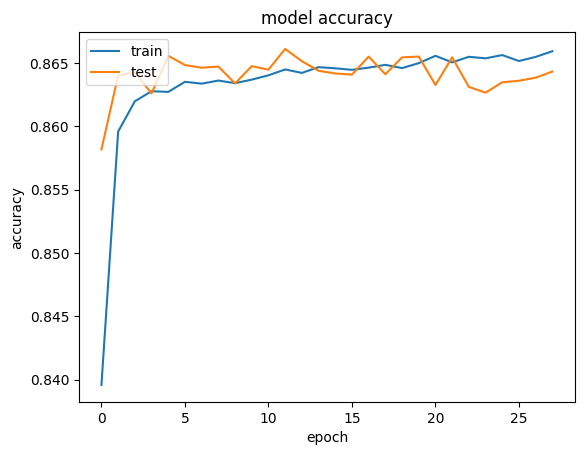

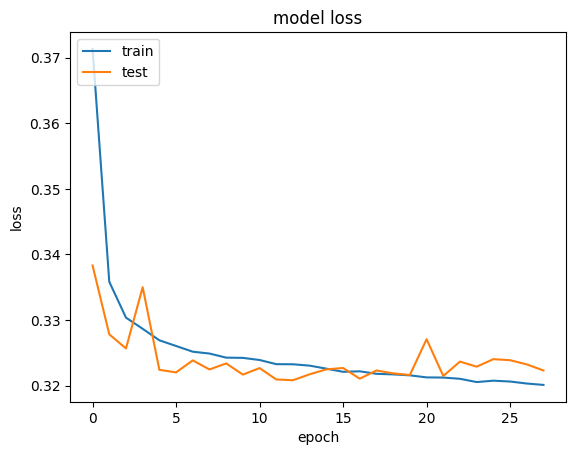

In [149]:

# create Deep neural network model
model= tf.keras.models.Sequential([
    tf.keras.layers.Dense(64, activation='relu', input_shape=(x_train.shape[1],)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(4, activation='relu'),
    tf.keras.layers.Dense(2, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')# for binary classification
    
])
# apply the call back function
early_stop=EarlyStopping(patience=15)
# compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
# plot the training and testing for each epoch
history = model.fit(x_train, y_train, epochs=100, batch_size=32, verbose=1, validation_data=(x_test, y_test), callbacks=[early_stop])

# plot the accuracy and validation accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# plot the loss and validation loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()





 # <span style="color:red;"><strong><u>XGBClassifier </u></strong></span></p>


Accuracy: 0.8674826551943527
Best Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200}
Best Score: 0.8653684788692063
accuracy: 0.8674826551943527
precision: 0.7417119310732347
recall: 0.5693745506829619
f1: 0.6442166910688141
confusion_matrix: [[24673  1379]
 [ 2995  3960]]
classification_report :               precision    recall  f1-score   support

           0       0.89      0.95      0.92     26052
           1       0.74      0.57      0.64      6955

    accuracy                           0.87     33007
   macro avg       0.82      0.76      0.78     33007
weighted avg       0.86      0.87      0.86     33007



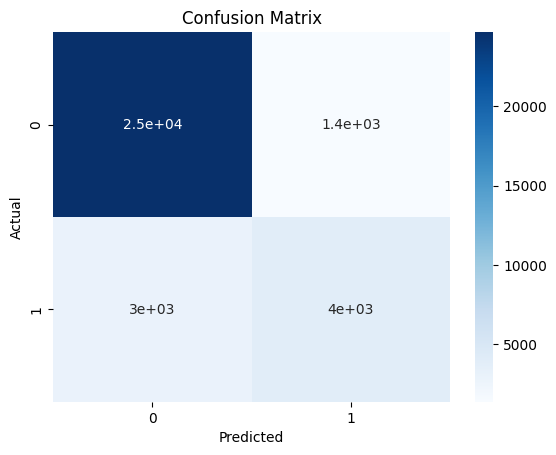

In [145]:
from xgboost import XGBClassifier
# call the model
xgb=XGBClassifier()
# fit the model
xgb.fit(x_train, y_train)
# predict the model
y_pred=xgb.predict(x_test)
from sklearn.model_selection import GridSearchCV
# create the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.1, 0.01, 0.001]
    }

# create the grid search object
grid_search = GridSearchCV(xgb, param_grid, cv=5)
# fit the grid search object to the training data
grid_search.fit(x_train, y_train)
# print the best parameters and score
best_params= grid_search.best_params_
best_score =  grid_search.best_score_
# create a new model with the best parameters
xgb= XGBClassifier(**best_params)
# train the model with updata  hyperparameters
xgb.fit(x_train, y_train)
# predict the model
y_pred=xgb.predict(x_test)
accuracy= accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
print("Best Parameters:", best_params)
print("Best Score:", best_score)
# evaluate the model
print('accuracy:' ,accuracy_score(y_test, y_pred))
print('precision:', precision_score(y_test, y_pred))
print('recall:', recall_score(y_test, y_pred))
print('f1:' , f1_score(y_test, y_pred))
print('confusion_matrix:' ,confusion_matrix(y_test, y_pred))
print('classification_report :', classification_report(y_test, y_pred))

# calculate the confision matrix
confusion_matrix(y_test, y_pred)
# plot the confusion matrix
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()




 
 # <span style="color:red;"><strong><u>Apply the  XGBClassifier and machine laearnig model with HyperparameterTuning </u></strong></span></p>


In [148]:
# call the models
models = {
    'Logistic Regression': (LogisticRegression(random_state=42), {}),
    'KNN': (KNeighborsClassifier(), {'model__n_neighbors': [10, 30]}),
    #'SVC': (SVC(random_state=42), {'model__gamma': ['scale', 'auto']}),
    'DecisionTreeClassifier': (DecisionTreeClassifier(random_state=42), {'model__max_depth': [5, 10, 15]}),
    'RandomForestClassifier': (RandomForestClassifier(random_state=42), {'model__n_estimators': [100, 200, 300], 'model__max_depth': [5, 10, 15]}),
    'GradientBoostingClassifier': (GradientBoostingClassifier(random_state=42), {'model__learning_rate': [0.1, 0.01, 0.001]}),
    'AdaBoostClassifier': (AdaBoostClassifier(random_state=42), {'model__n_estimators': [50, 100, 200]}),
    'XGBClassifier': (XGBClassifier(random_state=42), {'model__max_depth': [3, 4, 5]}),
    'Naive Bayes': (GaussianNB(), {})
}
best_model=None
best_accuracy=0
for name,(models,params) in models.items():
    pipeline=Pipeline(steps=[
        ('model',models)
])
    # Apply the cross validation score
    scores=cross_val_score(pipeline, x_train, y_train,cv=5, verbose=0)
    # mean_accuracy
    mean_accuracy=scores.mean()
    # predict the pipeline
    pipeline.fit(x_train,y_train)
    # Train the pipeline
    y_pred=pipeline.predict(x_test)
    accuracy=accuracy_score(y_test,y_pred)
    # print the evaluation metrics
    print('Model', name)
    print('Cross_validation accuracy', mean_accuracy)
    print('accuracy', accuracy)
    print('\n')


    # Evaluate the model
    if accuracy > best_accuracy:
       best_accuracy = accuracy
       best_model = pipeline
# print the best model
print("Best Model is:", best_model)

# Save the best model
# import pickle
# pickle.dump(best_model, open('./sample_submission.csv1/sumission_bank_churn_data.csv'))

Model Logistic Regression
Cross_validation accuracy 0.8287017288752336
accuracy 0.8275214348471537


Model KNN
Cross_validation accuracy 0.8376392883687428
accuracy 0.8393977035174357


Model DecisionTreeClassifier
Cross_validation accuracy 0.7943148254494443
accuracy 0.7965886024176689


Model RandomForestClassifier
Cross_validation accuracy 0.857756380300834
accuracy 0.8576968521828703


Model GradientBoostingClassifier
Cross_validation accuracy 0.8636188346273233
accuracy 0.865513375950556


Model AdaBoostClassifier
Cross_validation accuracy 0.8568323323945458
accuracy 0.8583330808616354


Model XGBClassifier
Cross_validation accuracy 0.8633537198392262
accuracy 0.8649983336867937


Model Naive Bayes
Cross_validation accuracy 0.8220818680599452
accuracy 0.8202199533432303


Best Model is: Pipeline(steps=[('model', GradientBoostingClassifier(random_state=42))])



 
 # <span style="color:red;"><strong><u>Creating the submission file </u></strong></span></p>


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Apply binning to Age column in the test dataset
test_df['binned_Age'] = pd.cut(test_df['Age'], bins=[18, 40, 60, 75, 90],
labels=['Adult', 'Middle_aged', 'older', 'oldest'])

# Convert categorical columns to numerical values
le = LabelEncoder()
test_df['Geography'] = le.fit_transform(test_df['Geography'])
test_df['Gender'] = le.fit_transform(test_df['Gender'])

# Drop unnecessary columns from the test dataset
test_df.drop(['id', 'CustomerId', 'Surname'], axis=1, inplace=True)

# Predict the test data and create a submission file of probability of each class
y_pred = xgb.predict_proba(test_df)
submission['Exited'] = y_pred[:, 1]
submission.to_csv('submission_bank_churn2.csv', index=False)

# summary
In this we make the deep learning moodel and XGBClassifier then the result is given that the accuracy of XGBClassifier is 0.8674
and other deep leraning and machine learning  model have less accuracy so we select the XGBClassifier have the more accuracy  